In [1]:
import mne
import pandas as pd 
import re #regex library to format fast to read into pd 
import os
import neurokit2 as nk 
import matplotlib.pyplot as plt
import feather 
import numpy as np
import platform
os.chdir('/Users/leupinv/switchdrive/BBC/WP1/data/Code/python/tsk_processing/base')
from files_in_out import getListOfFiles,GetFiles



In [2]:

if platform.system()=='Darwin':
    os.chdir('/Users/leupinv/switchdrive/BBC/WP1/data/EEG/tsk/')

else:
    os.chdir('c:/Users/Engi/all/BBC/WP1/data/EEG/tsk')

In [3]:
g_num='g03'
eeg_format='.fif'
eeg_exp='tsk'
datafolder='preproc'

#files = getListOfFiles(datafolder,g_num)

files = GetFiles(datafolder,g_num=g_num,eeg_format=eeg_format)

taskfiles=files.taskfiles

taskfiles=[x for x in taskfiles if 'rec' not in x]
taskfiles=[x for x in taskfiles if '_n_'  in x]
taskfiles

['preproc/g03/g03_epochs/g03_n_tsk_exp_epo.fif',
 'preproc/g03/g03_epochs/g03_n_tsk_ICA_log.fif',
 'preproc/g03/g03_epochs/g03_n_tsk_ecg_epo.fif',
 'preproc/g03/g03_epochs/g03_n_tsk_ecg_vep_clean_epo.fif',
 'preproc/g03/g03_epochs/g03_n_tsk_eog_epo.fif',
 'preproc/g03/g03_ICA/g03_n_tsk_fast-ica.fif',
 'preproc/g03/g03_ICA/g03_n_tsk_info-ica.fif']

In [4]:
files.select_condition('n')
files.get_info(index=2,end_fix=-12,start_fix=16)

dir_tsk=files.current_file_dir
dir_tsk

'preproc/g03/g03_epochs/g03_n_tsk_ICA_log.fif'

In [5]:
files.current_filename

'g03_n_tsk'

In [6]:
#%cd /Users/leupinv/switchdrive/BBC/WP1/data/EEG/tsk/raw/g01/ 
def filter_list(list_,value):
    filter_list=[x for x in list_ if value in x]
    return filter_list[0]
    


#ica=mne.preprocessing.read_ica(filter_list(taskfiles,'_ica'))
ica=mne.preprocessing.read_ica(filter_list(taskfiles,'fast-ica'))
exp_epo=mne.read_epochs(filter_list(taskfiles,'exp'))
eog_epo=mne.read_epochs(filter_list(taskfiles,'eog'))
ecg_epo=mne.read_epochs(filter_list(taskfiles,'ecg'))


Reading preproc/g03/g03_ICA/g03_n_tsk_fast-ica.fif ...
Now restoring ICA solution ...
Ready.
Reading preproc/g03/g03_epochs/g03_n_tsk_exp_epo.fif ...


<ipython-input-6-aa54d664a39e>:9: DeprecationWarning: Version 0.23 introduced max_iter="auto", setting max_iter=1000 for `fastica` and max_iter=500 for `infomax` and `picard`. The current default of max_iter=200 will be changed to "auto" in version 0.24.
  ica=mne.preprocessing.read_ica(filter_list(taskfiles,'fast-ica'))


    Found the data of interest:
        t =    -199.22 ...    1000.00 ms
        0 CTF compensation matrices available
Not setting metadata
Not setting metadata
3112 matching events found
No baseline correction applied
0 projection items activated
Reading preproc/g03/g03_epochs/g03_n_tsk_eog_epo.fif ...
    Found the data of interest:
        t =    -500.00 ...     500.00 ms
        0 CTF compensation matrices available
Not setting metadata
Not setting metadata
841 matching events found
No baseline correction applied
0 projection items activated
Reading preproc/g03/g03_epochs/g03_n_tsk_ecg_epo.fif ...
    Found the data of interest:
        t =    -500.00 ...     500.00 ms
        0 CTF compensation matrices available
Not setting metadata
Not setting metadata
2959 matching events found
No baseline correction applied
0 projection items activated


In [7]:
eeg_format='.fif'
eeg_exp='tsk'
datafolder='raw'
condition='n'

#files = getListOfFiles(datafolder,g_num)

fif_files = GetFiles(datafolder,g_num=g_num,eeg_format=eeg_format)
fif_files.select_condition(condition)
fif_taskfiles=fif_files.condition_files
fif_taskfiles

['raw/g03/g03_n_tsk_ds_eeg.fif']

In [8]:
raw_dir=fif_taskfiles[0]
raw=mne.io.read_raw_fif(raw_dir,preload=True)


Opening raw data file raw/g03/g03_n_tsk_ds_eeg.fif...
    Range : 0 ... 638207 =      0.000 ...  2492.996 secs
Ready.
Reading 0 ... 638207  =      0.000 ...  2492.996 secs...


In [26]:

exp_hep=exp_epo['xns']
exp_hep

Number of events,958
Events,xns/easy/correct/aware: 118xns/easy/mistake/unaware: 1xns/normal/correct/aware: 379xns/normal/correct/unaware: 225xns/normal/mistake/aware: 16xns/normal/mistake/unaware: 219
Time range,-0.199 – 1.000 sec
Baseline,off


In [13]:
epo_id=exp_hep.event_id
epo_id

{'hep/easy/R/exh/CA/RRCA': 1,
 'hep/easy/R/inh/CA/RRCA': 2,
 'hep/easy/R2/exh/CA/RRCA': 3,
 'hep/easy/R2/inh/CA/RRCA': 4,
 'hep/easy/T/exh/CA/no_val': 5,
 'hep/easy/T/inh/CA/no_val': 6,
 'hep/easy/T2/exh/CA/no_val': 7,
 'hep/easy/T2/inh/CA/no_val': 8,
 'hep/normal/R/exh/CA/RRCA': 9,
 'hep/normal/R/exh/CU/RRCU': 10,
 'hep/normal/R/inh/CA/RRCA': 11,
 'hep/normal/R/inh/CU/RRCU': 12,
 'hep/normal/R2/exh/CA/RRCA': 13,
 'hep/normal/R2/exh/CU/RRCU': 14,
 'hep/normal/R2/inh/CA/RRCA': 15,
 'hep/normal/R2/inh/CU/RRCU': 16,
 'hep/normal/T/exh/CA/no_val': 17,
 'hep/normal/T/exh/CU/no_val': 18,
 'hep/normal/T/inh/CA/no_val': 19,
 'hep/normal/T/inh/CU/no_val': 20,
 'hep/normal/T2/exh/CA/no_val': 21,
 'hep/normal/T2/exh/CU/no_val': 22,
 'hep/normal/T2/inh/CA/no_val': 23,
 'hep/normal/T2/inh/CU/no_val': 24}

In [25]:
labels=[k.split('/') for k,v in epo_id.items()]
labels=[x[:-1] for x in labels]
labels=[list(set(x).intersection(y)) for x in labels for y in labels]
labels=[list(i)for i in set(map(tuple,labels))]
labels_normal=[x for x in labels if 'normal' in x]
labels_normal.append(['RRCA','RRCU'])
labels_normal

[['T2', 'exh', 'CA', 'normal', 'hep'],
 ['CA', 'normal', 'hep', 'exh'],
 ['T2', 'normal', 'hep', 'exh'],
 ['T2', 'normal', 'inh', 'hep'],
 ['normal', 'hep', 'exh'],
 ['CU', 'inh', 'T', 'normal', 'hep'],
 ['normal', 'inh', 'hep'],
 ['normal', 'inh', 'hep', 'R2'],
 ['normal', 'CU', 'hep', 'exh'],
 ['T2', 'normal', 'hep'],
 ['inh', 'CA', 'T', 'normal', 'hep'],
 ['CA', 'normal', 'R', 'hep'],
 ['normal', 'CU', 'inh', 'hep'],
 ['inh', 'CA', 'normal', 'R', 'hep'],
 ['normal', 'hep', 'exh', 'R2'],
 ['CA', 'normal', 'hep'],
 ['exh', 'CA', 'R2', 'normal', 'hep'],
 ['T2', 'normal', 'CU', 'hep'],
 ['T', 'normal', 'CU', 'hep'],
 ['CA', 'normal', 'hep', 'R2'],
 ['normal', 'R', 'hep'],
 ['T2', 'CU', 'exh', 'normal', 'hep'],
 ['T', 'normal', 'hep', 'CA'],
 ['exh', 'CA', 'normal', 'R', 'hep'],
 ['normal', 'hep'],
 ['normal', 'CU', 'hep'],
 ['normal', 'hep', 'R2'],
 ['CU', 'exh', 'R2', 'normal', 'hep'],
 ['T2', 'normal', 'hep', 'CA'],
 ['T2', 'inh', 'CA', 'normal', 'hep'],
 ['T2', 'CU', 'inh', 'normal',

No projector specified for this dataset. Please consider the method self.add_proj.


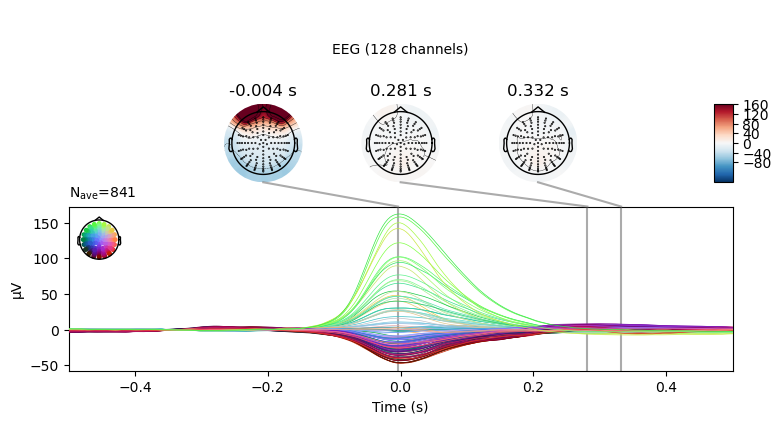

In [11]:
%matplotlib qt
eog_epo.average().plot_joint()

In [302]:
eog_epo

Number of events,947
Events,998: 947
Time range,-0.500 – 0.500 sec
Baseline,-0.500 – -0.200 sec


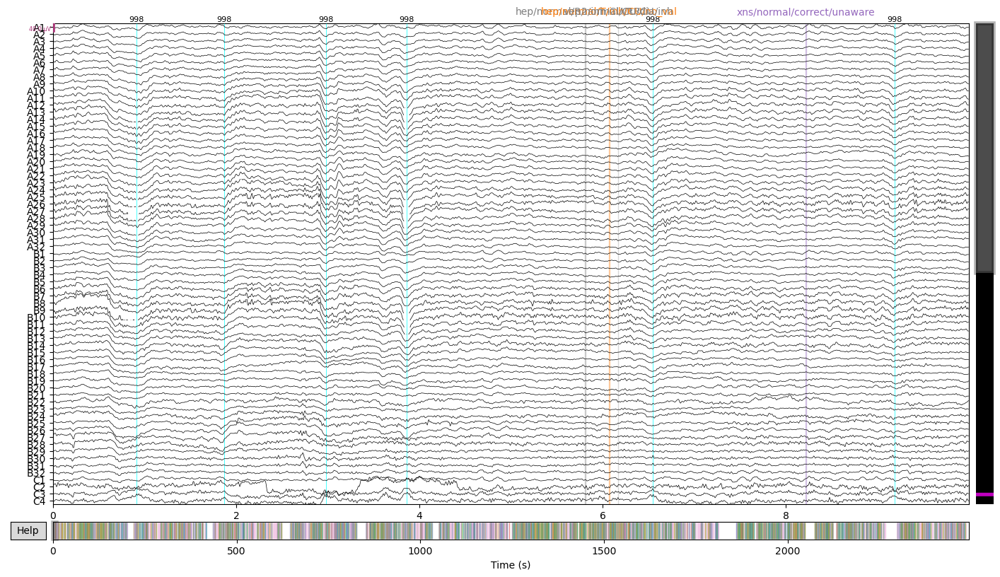

Channels marked as bad: none


In [15]:

raw.plot(n_channels=68,events=eog_epo.events)

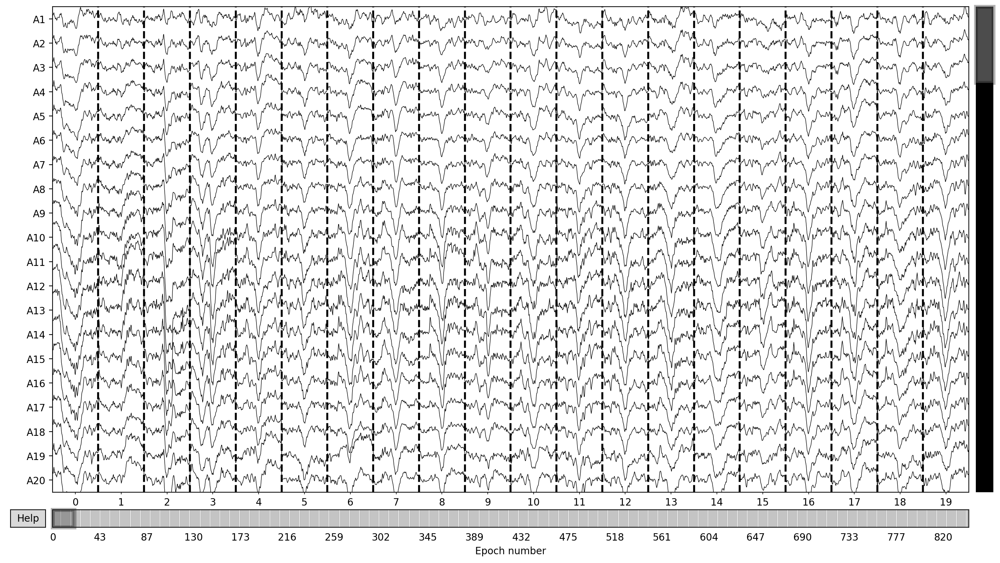

Dropped 0 epochs: 
Channels marked as bad: none


In [16]:
eog_epo.plot()



In [17]:
exp_epo['normal/vep']

Number of events,602
Events,vep/normal/CA/dia/exh: 137vep/normal/CA/dia/inh: 90vep/normal/CA/sys/exh: 90vep/normal/CA/sys/inh: 62vep/normal/CU/dia/exh: 79vep/normal/CU/dia/inh: 56vep/normal/CU/sys/exh: 53vep/normal/CU/sys/inh: 35
Time range,-0.199 – 1.000 sec
Baseline,off


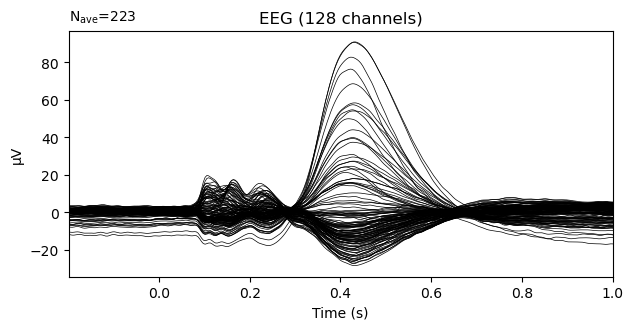

In [18]:
exp_epo['normal/vep/CU'].average().plot()


# Identify EOG components 

In [145]:
#eog_ep=mne.preprocessing.create_eog_epochs(raw,ch_name=['C16'],thresh=40e-6)

Using EOG channel: C16
EOG channel index for this subject is: [79]
Omitting 3709 of 638208 (0.58%) samples, retaining 634499 (99.42%) samples.
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2560 samples (10.000 sec)

Now detecting blinks and generating corresponding events
Found 1589 significant peaks
Number of EOG events detected: 1589
Not setting metadata
Not setting metadata
1589 matching events found
No baseline correction applied
Loading data for 1589 events and 257 original time points ...
5 bad 

In [26]:
eog_epo

Number of events,927
Events,998: 927
Time range,-0.500 – 0.500 sec
Baseline,-0.500 – -0.200 sec


In [19]:
eog_inds, eog_scores = ica.find_bads_eog(eog_epo,ch_name='C16')  # find via correlation

ica.plot_scores(eog_scores);  # look at r scores of components

Using EOG channel: C16


Using matplotlib backend: Qt5Agg
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


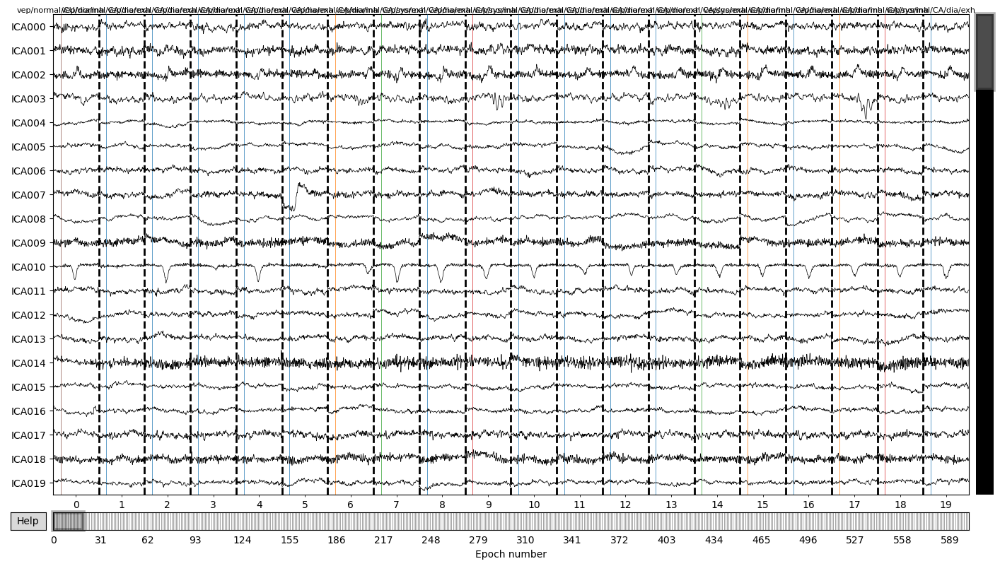

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied


In [27]:
%matplotlib auto
plot_idx=np.arange(0,26)

ica.plot_components(inst=exp_epo['vep/normal'])

ica.plot_sources(inst=exp_epo['vep/normal'])

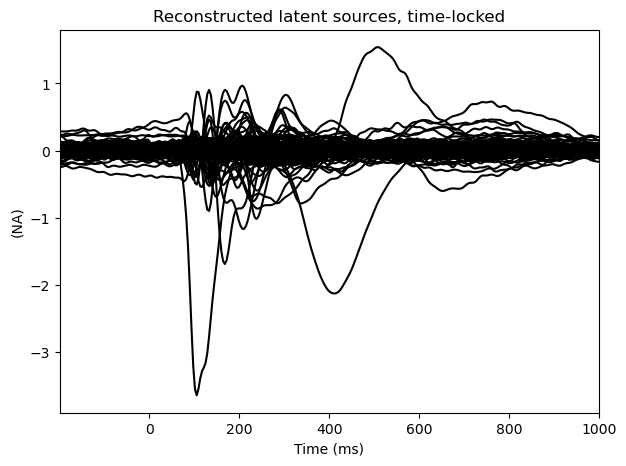

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


In [28]:
ica.plot_sources(exp_epo['vep'].average())

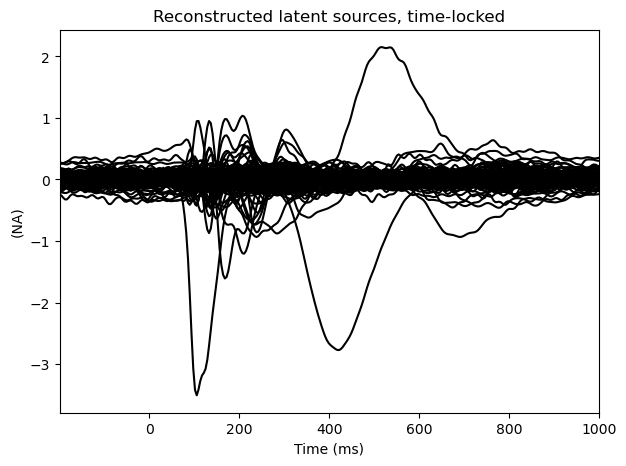

In [23]:
eog_inds

[10, 52, 2, 48, 95, 22]

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
3112 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


In [24]:
eog_inds=[10,2]

Applying ICA to Evoked instance
    Transforming to ICA space (127 components)
    Zeroing out 2 ICA components
    Projecting back using 128 PCA components


<ipython-input-25-ca65bda30232>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica.plot_overlay(eog_epo.average(), exclude=eog_inds, show=False)


Applying ICA to Evoked instance
    Transforming to ICA space (127 components)
    Zeroing out 2 ICA components
    Projecting back using 128 PCA components


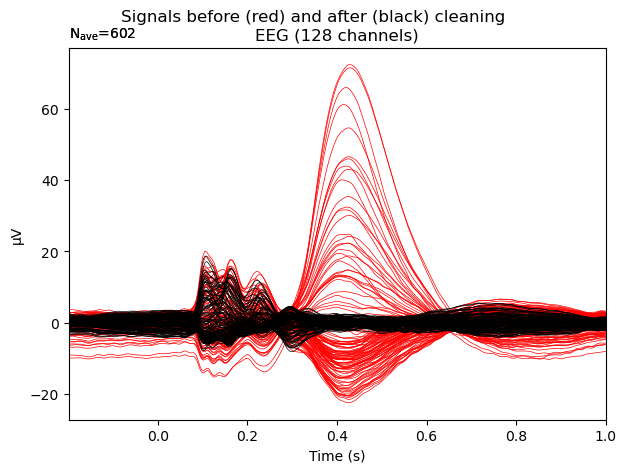

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
3112 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


In [25]:

ica.plot_overlay(eog_epo.average(), exclude=eog_inds, show=False)
ica.plot_overlay(exp_epo['normal/vep'].average(), exclude=eog_inds, show=False)

# red -> before, black -> after. Yes! We remove quite a lot!


Applying ICA to Evoked instance
    Transforming to ICA space (127 components)
    Zeroing out 4 ICA components
    Projecting back using 128 PCA components


<ipython-input-32-50a78b092c3c>:4: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica.plot_overlay(eog_epo.average(), exclude=eog_inds+artefact_idx, show=False)


Applying ICA to Evoked instance
    Transforming to ICA space (127 components)
    Zeroing out 4 ICA components
    Projecting back using 128 PCA components


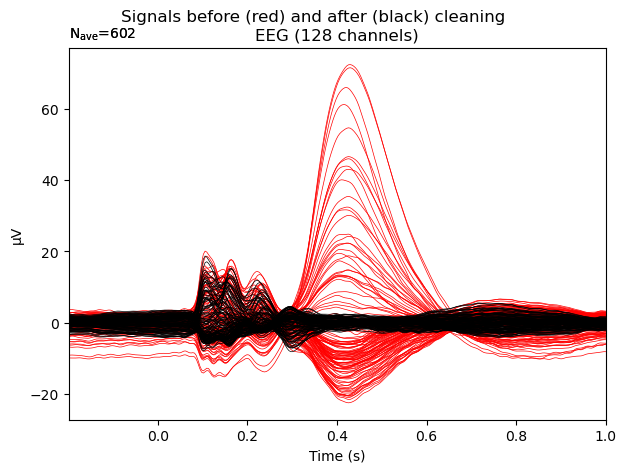

In [32]:
#extra inds to test 
artefact_idx=[44,21]

ica.plot_overlay(eog_epo.average(), exclude=eog_inds+artefact_idx, show=False)
ica.plot_overlay(exp_epo['vep/normal'].average(), exclude=eog_inds+artefact_idx, show=False)

In [33]:
print(ica.exclude)
print(eog_inds)
print(artefact_idx)

[]
[10, 2]
[44, 21]


In [34]:
ica.exclude=[]
ica.exclude.extend(eog_inds+artefact_idx)

In [35]:
reconst_eog = exp_epo.copy()

ica.apply(reconst_eog)

Applying ICA to Epochs instance
    Transforming to ICA space (127 components)
    Zeroing out 4 ICA components
    Projecting back using 128 PCA components


Number of events,3112
Events,hep/easy/R/exh/CA/RRCA: 19hep/easy/R/inh/CA/RRCA: 18hep/easy/R2/exh/CA/RRCA: 50hep/easy/R2/inh/CA/RRCA: 31hep/easy/T/exh/CA/no_val: 52hep/easy/T/inh/CA/no_val: 30hep/easy/T2/exh/CA/no_val: 23hep/easy/T2/inh/CA/no_val: 14hep/normal/R/exh/CA/RRCA: 68hep/normal/R/exh/CU/RRCU: 42hep/normal/R/inh/CA/RRCA: 60hep/normal/R/inh/CU/RRCU: 26hep/normal/R2/exh/CA/RRCA: 160hep/normal/R2/exh/CU/RRCU: 97hep/normal/R2/inh/CA/RRCA: 89hep/normal/R2/inh/CU/RRCU: 54hep/normal/T/exh/CA/no_val: 161hep/normal/T/exh/CU/no_val: 91hep/normal/T/inh/CA/no_val: 90hep/normal/T/inh/CU/no_val: 63hep/normal/T2/exh/CA/no_val: 73hep/normal/T2/exh/CU/no_val: 42hep/normal/T2/inh/CA/no_val: 55hep/normal/T2/inh/CU/no_val: 25vep/easy/CA/dia/exh: 47vep/easy/CA/dia/inh: 28vep/easy/CA/sys/exh: 21vep/easy/CA/sys/inh: 23vep/normal/CA/dia/exh: 137vep/normal/CA/dia/inh: 90vep/normal/CA/sys/exh: 90vep/normal/CA/sys/inh: 62vep/normal/CU/dia/exh: 79vep/normal/CU/dia/inh: 56vep/normal/CU/sys/exh: 53vep/normal/CU/sys/inh: 35xns/easy/correct/aware: 118xns/easy/mistake/unaware: 1xns/normal/correct/aware: 379xns/normal/correct/unaware: 225xns/normal/mistake/aware: 16xns/normal/mistake/unaware: 219
Time range,-0.199 – 1.000 sec
Baseline,off


No projector specified for this dataset. Please consider the method self.add_proj.


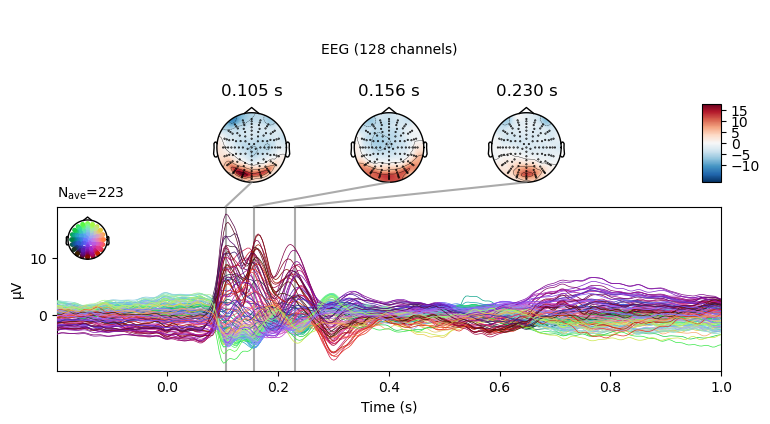

In [38]:
topomap_args={'outlines':'head'}
reconst_eog['normal/vep/CU'].average().plot_joint(topomap_args=topomap_args)

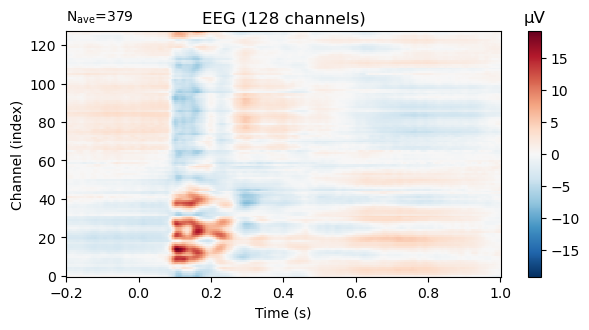

In [37]:
reconst_eog['normal/vep/CA'].average().plot_image()

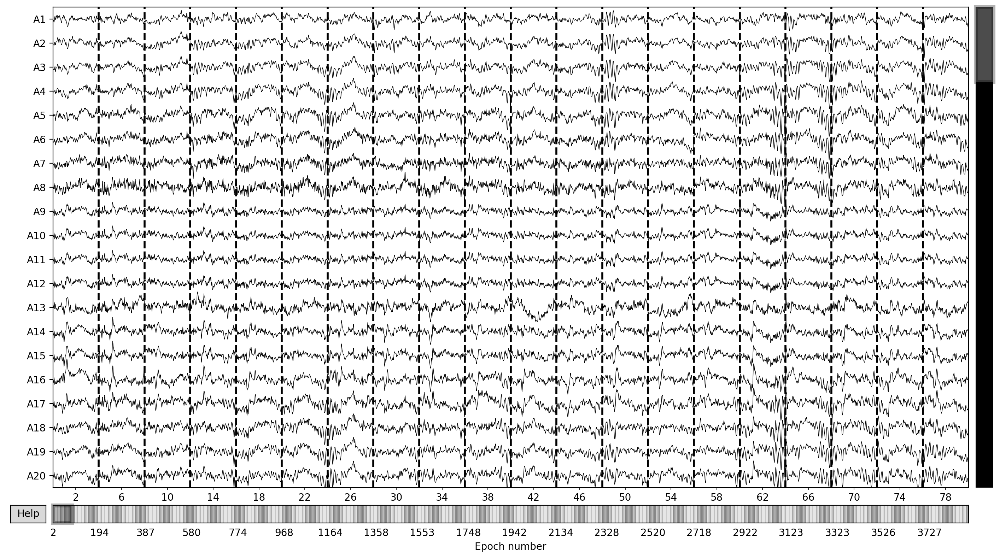

Dropped 0 epochs: 
Channels marked as bad: none


In [267]:
reconst_eog_vep=reconst_eog['vep']
reconst_eog_vep.plot()

No projector specified for this dataset. Please consider the method self.add_proj.


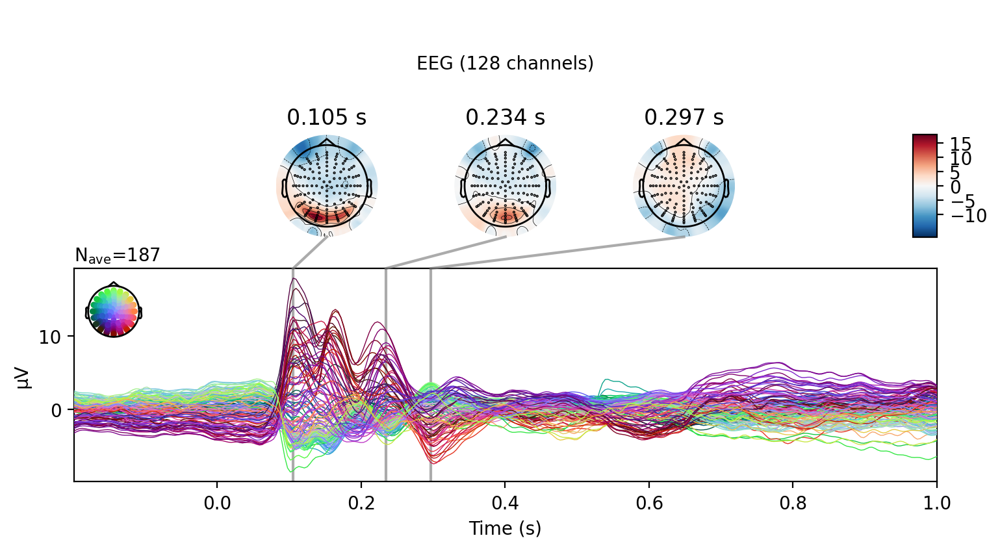

In [145]:
reconst_eog_vep['normal/CU'].average().plot_joint()

# Heart artefact removal 


... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 2560 samples (10.000 sec)

... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 2560 s

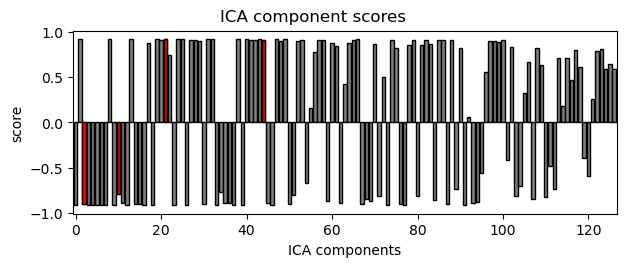

In [39]:
ecg_ica_indices, ecg_ica_scores = ica.find_bads_ecg(raw, method='correlation',
                                            threshold='auto')


ica.plot_scores(ecg_ica_scores)



In [40]:
ecg_ica_indices

[]

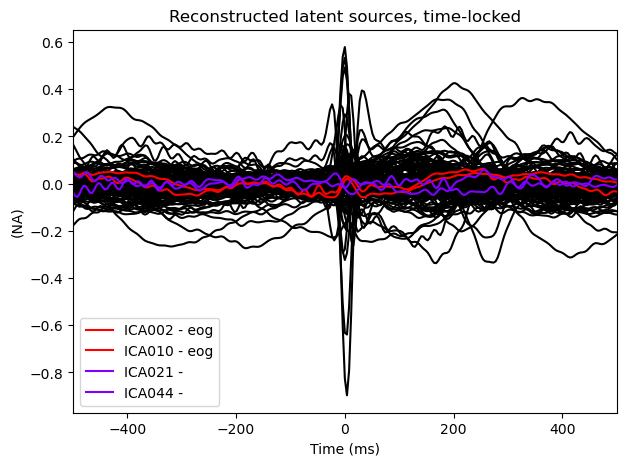

In [42]:
ica.plot_sources(inst=ecg_epo.average())

In [ ]:

#ecg_ica_indices_3, ecg_ica_scores_3 = ica.find_bads_ecg(raw, method='correlation',
                                            #threshold='auto')

In [219]:
print(ecg_ica_indices)


[0, 6, 14]


In [43]:
ecg_ica_indices=[17,56]
#for g03 17 and 56 are heart components, IC 17 impact the vep while 56 does not, you need to remve both to really remove the R peak

In [44]:
ica.plot_properties(inst=ecg_epo,picks=ecg_ica_indices)

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
2959 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metadata
2959 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


[<Figure size 700x600 with 6 Axes>, <Figure size 700x600 with 6 Axes>]

/Applications/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/ica.py:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


In [45]:
#manually identified ecg component = ICA14
ecg_remove=ecg_ica_indices

Applying ICA to Evoked instance
    Transforming to ICA space (127 components)
    Zeroing out 4 ICA components
    Projecting back using 128 PCA components
Applying ICA to Evoked instance
    Transforming to ICA space (127 components)
    Zeroing out 6 ICA components
    Projecting back using 128 PCA components
Applying ICA to Evoked instance
    Transforming to ICA space (127 components)
    Zeroing out 4 ICA components
    Projecting back using 128 PCA components
Applying ICA to Evoked instance
    Transforming to ICA space (127 components)
    Zeroing out 6 ICA components
    Projecting back using 128 PCA components


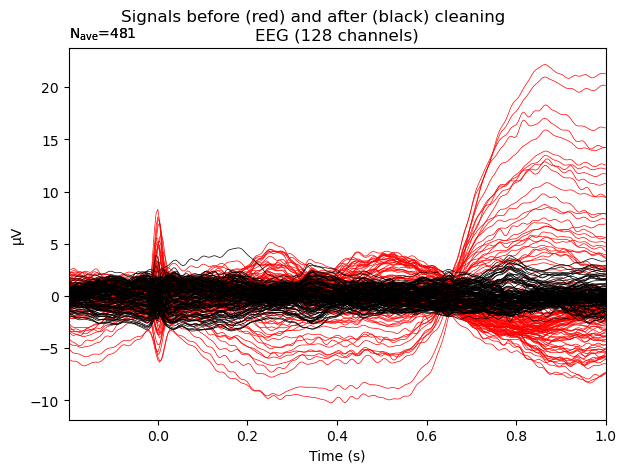

In [48]:
ica.plot_overlay(exp_epo['vep/dia'].average(), exclude=eog_inds+artefact_idx, show=False)
ica.plot_overlay(exp_epo['vep/dia'].average(), exclude=eog_inds+artefact_idx+ecg_remove, show=False)
ica.exclude=[]
ica.plot_overlay(exp_epo['hep/R2'].average(), exclude=eog_inds+artefact_idx, show=False)
ica.plot_overlay(exp_epo['hep/R2'].average(), exclude=eog_inds+artefact_idx+ecg_remove, show=False)

In [49]:
ica.exclude=[]
ica.exclude.extend(eog_inds+ecg_remove+artefact_idx)
ica.exclude

[10, 2, 17, 56, 44, 21]

In [50]:
reconst_ecg = exp_epo.copy()

ica.apply(reconst_ecg)

Applying ICA to Epochs instance
    Transforming to ICA space (127 components)
    Zeroing out 6 ICA components
    Projecting back using 128 PCA components


Number of events,3112
Events,hep/easy/R/exh/CA/RRCA: 19hep/easy/R/inh/CA/RRCA: 18hep/easy/R2/exh/CA/RRCA: 50hep/easy/R2/inh/CA/RRCA: 31hep/easy/T/exh/CA/no_val: 52hep/easy/T/inh/CA/no_val: 30hep/easy/T2/exh/CA/no_val: 23hep/easy/T2/inh/CA/no_val: 14hep/normal/R/exh/CA/RRCA: 68hep/normal/R/exh/CU/RRCU: 42hep/normal/R/inh/CA/RRCA: 60hep/normal/R/inh/CU/RRCU: 26hep/normal/R2/exh/CA/RRCA: 160hep/normal/R2/exh/CU/RRCU: 97hep/normal/R2/inh/CA/RRCA: 89hep/normal/R2/inh/CU/RRCU: 54hep/normal/T/exh/CA/no_val: 161hep/normal/T/exh/CU/no_val: 91hep/normal/T/inh/CA/no_val: 90hep/normal/T/inh/CU/no_val: 63hep/normal/T2/exh/CA/no_val: 73hep/normal/T2/exh/CU/no_val: 42hep/normal/T2/inh/CA/no_val: 55hep/normal/T2/inh/CU/no_val: 25vep/easy/CA/dia/exh: 47vep/easy/CA/dia/inh: 28vep/easy/CA/sys/exh: 21vep/easy/CA/sys/inh: 23vep/normal/CA/dia/exh: 137vep/normal/CA/dia/inh: 90vep/normal/CA/sys/exh: 90vep/normal/CA/sys/inh: 62vep/normal/CU/dia/exh: 79vep/normal/CU/dia/inh: 56vep/normal/CU/sys/exh: 53vep/normal/CU/sys/inh: 35xns/easy/correct/aware: 118xns/easy/mistake/unaware: 1xns/normal/correct/aware: 379xns/normal/correct/unaware: 225xns/normal/mistake/aware: 16xns/normal/mistake/unaware: 219
Time range,-0.199 – 1.000 sec
Baseline,off


No projector specified for this dataset. Please consider the method self.add_proj.


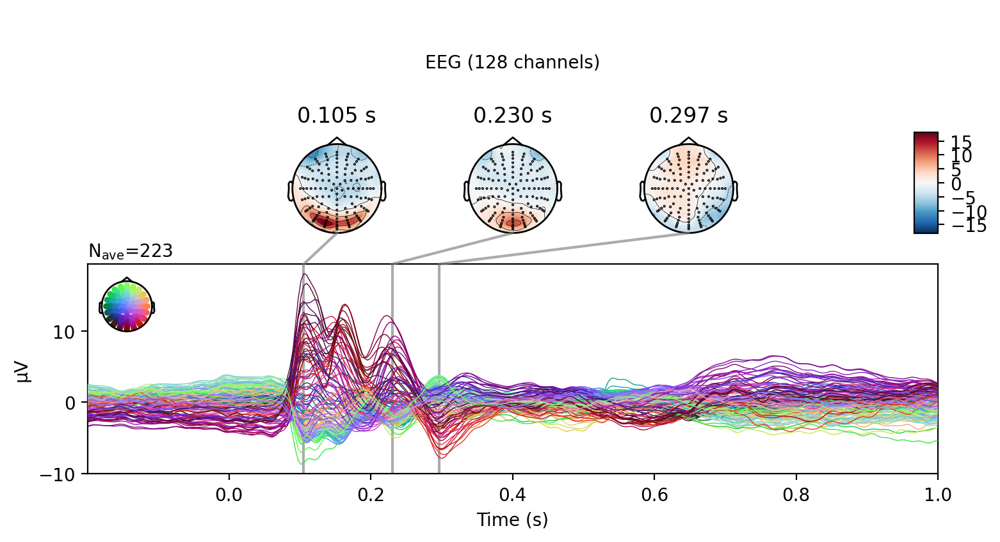

In [160]:
topomap_args={'outlines':'head'}
reconst_eog['vep/CU'].average().plot_joint(topomap_args=topomap_args)

No projector specified for this dataset. Please consider the method self.add_proj.


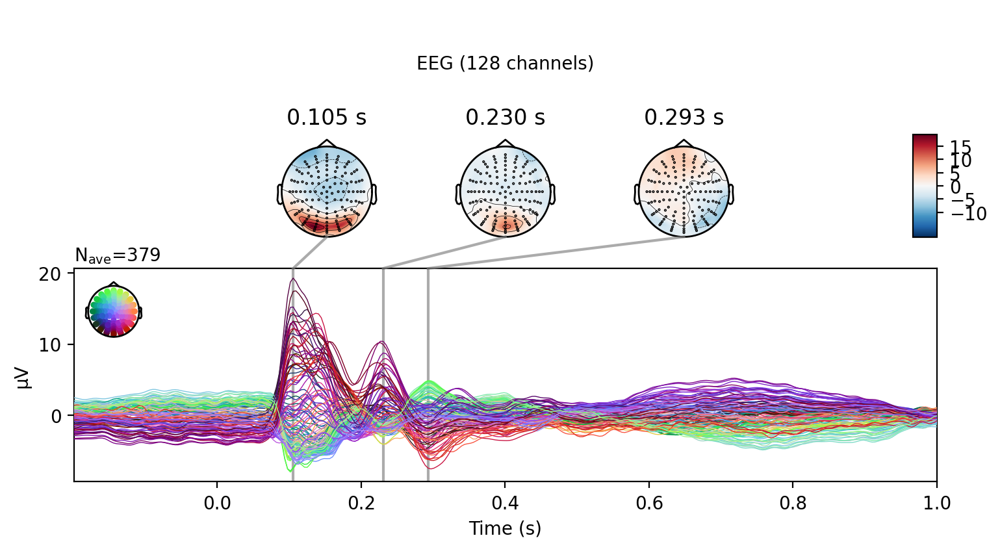

In [162]:
topomap_args={'outlines':'head'}
reconst_ecg['normal/vep/CA'].average().plot_joint(topomap_args=topomap_args)

# Save epochs output

In [270]:
type_sig='epochs'
file_end='nc_rec_epo.fif'

output_filename=files.out_filename(type_sig=type_sig,file_end=file_end)


reconst_ecg.save(output_filename,overwrite=True)

type_sig='epochs'
file_end='cfa_epo.fif'

output_filename=files.out_filename(type_sig=type_sig,file_end=file_end)


reconst_eog.save(output_filename,overwrite=True)


Overwriting existing file.
Overwriting existing file.


In [271]:
# save log 
file_end='ICA_log.txt'

output_filename=files.out_filename(type_sig=type_sig,file_end=file_end)



with open(output_filename,'w') as file:
    file.write(f'eog index={eog_inds}\n')
    file.write(f'artefact index={artefact_idx}\n')
    file.write(f'ecg index={ecg_ica_indices}\n')

In [ ]:
stop

# Art rej

In [59]:
from autoreject import AutoReject

n_interpolate=np.array([5,10,32])
consensus = np.linspace(0.1, 0.5, 6)
#n_interpolate=n_interpolate,consensus=consensus,

ar_vep = AutoReject(thresh_method='random_search',
                random_state=42)

In [60]:
#reconst_eog.info['bads'] = []
#picks = mne.pick_types(raw.info, meg=False, eeg=True)
#epochs = mne.Epochs(reconst_raw, events_from_annot, event_id_test, tmin, tmax, proj=True,
                    #picks=picks, baseline=baseline, reject=None,                    
                    #preload=True)

# Note that fitting and transforming can be done on different compatible
# portions of data if needed.
reconst_eog_vep=reconst_eog['vep']

ar_vep.fit(reconst_eog_vep)

Running autoreject on ch_type=eeg


Computing thresholds ...: 100%|██████████| 128/128 [01:30<00:00,  1.41it/s]


Repairing epochs:   0%|          | 0/721 [00:00<?, ?it/s]

Repairing epochs:   4%|▍         | 28/721 [00:00<00:02, 275.10it/s]

Repairing epochs:   8%|▊         | 56/721 [00:00<00:02, 269.45it/s]

Repairing epochs:  12%|█▏        | 83/721 [00:00<00:02, 268.16it/s]

Repairing epochs:  15%|█▌        | 110/721 [00:00<00:02, 262.84it/s]

Repairing epochs:  19%|█▉        | 137/721 [00:00<00:02, 265.33it/s]

Repairing epochs:  23%|██▎       | 164/721 [00:00<00:02, 265.41it/s]

Repairing epochs:  26%|██▋       | 191/721 [00:00<00:02, 263.96it/s]

Repairing epochs:  30%|███       | 218/721 [00:00<00:01, 264.68it/s]

Repairing epochs:  34%|███▍      | 246/721 [00:00<00:01, 266.67it/s]

Repairing epochs:  38%|███▊      | 273/721 [00:01<00:01, 266.41it/s]

Repairing epochs:  42%|████▏     | 300/721 [00:01<00:01, 267.00it/s]

Repairing epochs:  45%|████▌     | 327/721 [00:01<00:01, 266.73it/s]

Repairing epochs:  49%|███

Repairing epochs:   1%|          | 8/721 [00:00<00:20, 34.68it/s]

Repairing epochs:   2%|▏         | 12/721 [00:00<00:20, 34.22it/s]

Repairing epochs:   2%|▏         | 16/721 [00:00<00:21, 33.54it/s]

Repairing epochs:   3%|▎         | 20/721 [00:00<00:22, 31.54it/s]

Repairing epochs:   3%|▎         | 24/721 [00:00<00:22, 31.36it/s]

Repairing epochs:   4%|▍         | 29/721 [00:00<00:19, 35.16it/s]

Repairing epochs:   5%|▍         | 34/721 [00:00<00:18, 37.89it/s]

Repairing epochs:   5%|▌         | 39/721 [00:01<00:17, 39.90it/s]

Repairing epochs:   6%|▌         | 44/721 [00:01<00:16, 40.56it/s]

Repairing epochs:   7%|▋         | 49/721 [00:01<00:16, 41.37it/s]

Repairing epochs:   7%|▋         | 54/721 [00:01<00:18, 36.85it/s]

Repairing epochs:   8%|▊         | 58/721 [00:01<00:18, 35.02it/s]

Repairing epochs:   9%|▊         | 62/721 [00:01<00:19, 33.38it/s]

Repairing epochs:   9%|▉         | 66/721 [00:01<00:19, 33.34it/s]

Repairing epochs:  10%|▉         | 71/721 [00:01<

Repairing epochs:  29%|██▊       | 206/721 [00:04<00:12, 42.13it/s]

Repairing epochs:  29%|██▉       | 211/721 [00:05<00:12, 41.20it/s]

Repairing epochs:  30%|██▉       | 216/721 [00:05<00:12, 42.02it/s]

Repairing epochs:  31%|███       | 221/721 [00:05<00:11, 42.65it/s]

Repairing epochs:  31%|███▏      | 226/721 [00:05<00:11, 43.15it/s]

Repairing epochs:  32%|███▏      | 231/721 [00:05<00:11, 42.98it/s]

Repairing epochs:  33%|███▎      | 236/721 [00:05<00:11, 43.65it/s]

Repairing epochs:  33%|███▎      | 241/721 [00:05<00:10, 43.83it/s]

Repairing epochs:  34%|███▍      | 246/721 [00:05<00:10, 44.07it/s]

Repairing epochs:  35%|███▍      | 251/721 [00:05<00:11, 41.55it/s]

Repairing epochs:  36%|███▌      | 256/721 [00:06<00:12, 37.53it/s]

Repairing epochs:  36%|███▌      | 260/721 [00:06<00:12, 35.75it/s]

Repairing epochs:  37%|███▋      | 264/721 [00:06<00:12, 35.40it/s]

Repairing epochs:  37%|███▋      | 268/721 [00:06<00:13, 34.54it/s]

Repairing epochs:  38%|███▊      |





Estimated consensus=0.40 and n_interpolate=32


AutoReject(consensus=array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
      cv=10, n_interpolate=array([ 1,  4, 32]), n_jobs=1, picks=None,
      random_state=42, thresh_method='random_search',
      verbose='progressbar')

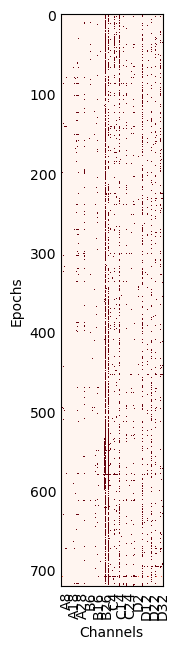

In [61]:
reject_log_vep = ar_vep.get_reject_log(reconst_eog_vep)
reject_log_vep.plot()

In [55]:
reject_log_vep.plot_epochs(reconst_eog_vep);

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
Not setting metadata
602 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Dropped 0 epochs: 
Channels marked as bad: none


In [56]:
epochs_clean_vep = ar_vep.transform(reconst_eog_vep)



Repairing epochs:   0%|          | 0/721 [00:00<?, ?it/s]

Repairing epochs:   1%|          | 4/721 [00:00<00:20, 35.28it/s]

Repairing epochs:   1%|          | 8/721 [00:00<00:19, 36.53it/s]

Repairing epochs:   2%|▏         | 12/721 [00:00<00:19, 37.18it/s]

Repairing epochs:   2%|▏         | 16/721 [00:00<00:18, 38.09it/s]

Repairing epochs:   3%|▎         | 20/721 [00:00<00:18, 38.15it/s]

Repairing epochs:   3%|▎         | 24/721 [00:00<00:18, 38.60it/s]

Repairing epochs:   4%|▍         | 29/721 [00:00<00:17, 39.78it/s]

Repairing epochs:   5%|▍         | 33/721 [00:00<00:17, 39.83it/s]

Repairing epochs:   5%|▌         | 37/721 [00:00<00:17, 39.58it/s]

Repairing epochs:   6%|▌         | 42/721 [00:01<00:16, 40.59it/s]

Repairing epochs:   7%|▋         | 47/721 [00:01<00:16, 41.67it/s]

Repairing epochs:   7%|▋         | 52/721 [00:01<00:15, 42.07it/s]

Repairing epochs:   8%|▊         | 57/721 [00:01<00:15, 42.30it/s]

Repairing epochs:   9%|▊         | 62/721 [00:01<00:15, 4

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


No projector specified for this dataset. Please consider the method self.add_proj.


/Applications/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:1212: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


No projector specified for this dataset. Please consider the method self.add_proj.


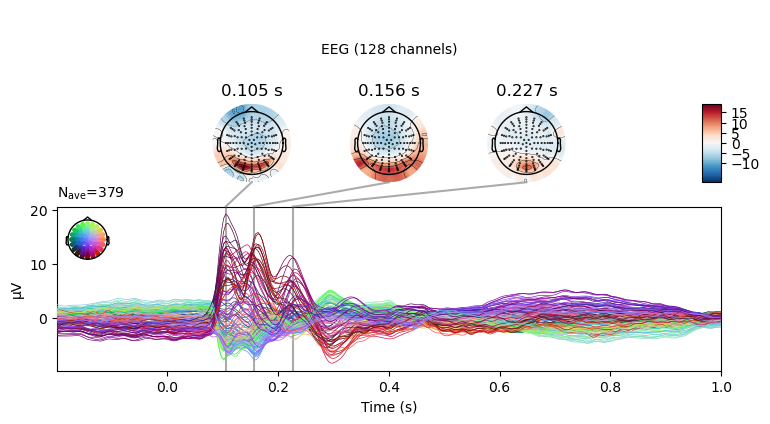

In [58]:
epochs_clean_vep['normal/vep/CA'].average().plot_joint()

reconst_eog_vep['normal/vep/CA'].average().plot_joint()



In [ ]:

#picks = mne.pick_types(raw.info, meg=False, eeg=True)
#epochs = mne.Epochs(reconst_raw, events_from_annot, event_id_test, tmin, tmax, proj=True,
                    #picks=picks, baseline=baseline, reject=None,                    
                    #preload=True)

# Note that fitting and transforming can be done on different compatible
# portions of data if needed.
ar_vep.fit(epochs_clean_vep)

In [ ]:
reject_log_vep = ar_vep.get_reject_log(epochs_clean_vep)
reject_log_vep.plot()

In [ ]:
reject_log_vep.plot_epochs(epochs_clean_vep);

In [ ]:
epochs_clean_vep_2 = ar_vep.transform(epochs_clean_vep)

In [ ]:

epochs_clean_vep['CA'].drop(indices).average().plot_joint()

In [ ]:
epochs_clean_vep_2['CU'].average().plot_joint()

In [ ]:
epochs_clean_vep['CA'].average().plot_joint()

# Plot joint with interactive topomaps

In [65]:
from ipywidgets import Layout, interact, IntSlider,interact_manual
%matplotlib inline
topomap_args={'outlines':'head'}
epochs_data=reconst_ecg
condition='normal/vep/CA'


def joint_topo(TF1,TF2,TF3):
    plot_j=epochs_data[condition].average().plot_joint(times=[TF1,TF2,TF3],topomap_args=topomap_args)
interact_manual(joint_topo,TF1=(-0.1, 1.0, 0.01),TF2=(-0.1, 1.0, 0.01),TF3=(-0.1, 1.0, 0.01))

interactive(children=(FloatSlider(value=0.45000000000000007, description='TF1', max=1.0, min=-0.1, step=0.01),…

<function __main__.joint_topo(TF1, TF2, TF3)>

In [ ]:
topomap_args={'outlines':'head'}
epochs_clean_vep['vep/CU'].average().plot_joint(0.164,topomap_args=topomap_args)

